# Reporte de Actividad 1

## Eduardo Ángeles Guerrero - A01653868

Para esta actividad se diseñó un sistema multiagente de aspiradoras automáticas y basura en un cuarto de dimensiones N x M. En este sistema se realizaron una serie de experimentos para encontrar algun comportamiento emergente de la interaccion entre nuestros agentes.
En esta actividad, nuestros agentes de aspiradoras automaticas solo tenian el precepto de su ubicación inicial p0 (1,1) y los agentes de basura tenían el precepto de su estado de limpieza, incializado en sucio (`self.dirty = True`).
A continuación se mostrara tanto la construcción del modelo de la forma descrita como los resultados de la simulación y datos estadísticos del comportamiento emergente del sistema.

Para empezar a crear el sistema importamos las siguientes librerias

In [86]:
import agentpy as ap               # Para los modelos, ambientes y agentes
import random as rand              # Para generación de numero aleatorios
import matplotlib.pyplot as plt    # Para graficar resultados estadísticos
import IPython                     # Para animar la simulación del sistema
import pandas as pd
import numpy as np

Una vez importadas las librerias se empezo con la creación de los agentes que interactuaran en el sistema.
### Clase Dirty (celdas sucias)

In [2]:
class Dirt (ap.Agent):
    def setup(self):
        self.dirty = True
        self.type = 1
        
    def clean(self):
        self.dirty = False
        self.type = 2

Para las celdas sucias se agrego un único comportamiento, el cual es usado para cambiar su estado de limpio a sucio.

### Clase Vaccum (aspiradoras automáticas)

In [5]:
class Vaccum (ap.Agent):
    def setup(self):
        self.direction = (0,0)
        self.moves = 0

    def turn(self, neightbors):
        for agent in neightbors:
            if (agent.dirty):
                agent.clean()
                self.direction = (0,0)
                return
        self.move()

    def move(self):
        direction = rand.randint(1,8)
        self.moves += 1
        match direction:
            case 1:
                self.direction = (-1,0)
            case 2:
                self.direction = (-1,1)
            case 3:
                self.direction = (0,1)
            case 4:
                self.direction = (1,1)
            case 5:
                self.direction = (1,0)
            case 6:
                self.direction = (1,-1)
            case 7:
                self.direction = (0,-1)
            case 8:
                self.direction = (-1,-1)

Para los agentes aspiradoras existe igualmente un único comportamiento `turn`, el cual es un comportamiento medianamente racional, ya que actua con eficiencia con la visión limitada que tiene del ambiente, pero toma una decisión aleatoria al momento de moverse, la cual no siempre ayuda a la limpieza del cuarto. Esto los convierte en agentes de __reflejos simples__ ya que solo actuaran con racionalidad cuando la condición de encontrarse sobre una celda sucia se cumple y de lo contrario su decisión sera irracional.

## Definición del modelo
Usando `agentpy` tambien es posible crear el modelo que describe el comportamiento del sistema. Esto se hace creando una clase que sea hija de `agentpy.Model` y en la cual estableceremos la configuración inicial del sistema (preceptos de los agentes) y las acciones que cada agente tomara en una unidad de tiempo determinada.

Este modelo es uno de tipo __episodico__ ya que, en cada momento, las decisiones de los agentes son independientes de sus decisiones anteriores. Tambien es del tipo __discreto__ ya que las acciones de los agentes estan definidas en la funcion `step`, la cual es llamada cada vez que se llame el turno del agente.

In [43]:
class Simulation (ap.Model):
    def setup(self):
        self.map = ap.Grid(self, shape=(self.p.n, self.p.m), track_empty=True)
        self.agents = ap.AgentList(self, self.p.n_agents, Vaccum)
        self.agents.type = 0
        self.dirty_spots = ap.AgentList(self, self.p.n_dirt, Dirt)
        self.dirty_spots.type = 1
        self.map.add_agents(
            agents=self.agents, 
            positions=[(0,0)] * self.p.n_agents
        )
        self.map.add_agents(
            agents=self.dirty_spots,
            random=True,
            empty=True
        )
        # print(self.map.agents.to_list().type != 0)
        self.dirty_count = []
        self.clean_count = []
        self.time = []

    def step(self):
        for agent in self.agents:
            list = self.map.neighbors(agent, distance=0).to_list()
            list = list.select(list.type == 1)
            agent.turn(list)
        self.record(
            "Dirty Spots", 
            value=len(self.dirty_spots.select(self.dirty_spots.type == 1))
        )
        self.record(
            "Moves",
            value=np.array([x.moves for x in self.agents])
        )
        self.dirty_count.append(len(self.dirty_spots.select(self.dirty_spots.type == 1)))
        self.clean_count.append(len(self.dirty_spots.select(self.dirty_spots.type == 2)))
        self.time.append(self.t)

    def update(self):
        for agent in self.agents:
            self.map.
            self.map.move_by(agent, agent.direction)
        # self.map.move_by(self.agents, self.agents.direction)
        dirty = self.dirty_spots.select(self.dirty_spots.type == 1)
        if (len(self.dirty_spots.select(self.dirty_spots.type == 1)) > 0):
            return
        self.end()

    def end(self):
        self.stop()

## Ejecución del modelo
Al momento de ejecutar el modelo, es posible cambiar sus parámetros mediante las variables:
- `N` (altura del mapa)
- `M` (anchura del mapa)
- `NUM_AGENTS` (numero de agentes) 
- `NUM_DIRT` (numero de celdas sucias) 
- `STEPS` (cantidad maxima de pasos).

In [88]:
N = 15
M = 15
NUM_AGENTS = 15
NUM_DIRT = 70
STEPS = 200

def visual_simulation(model, ax):
    # Graficando Ambiente (Mapa)
    plot = model.map.attr_grid('type')
    ap.gridplot(
        grid=plot,
        ax=ax[0],
        color_dict={
            0:'#000000',
            1:'#d62c2c',
            2:'#7FC97F',
            None: '#FFFFFF'
            },
        convert=True,
    )
    ax[0].set_title(f"Simulacion de aspiradoras automaticas\n"
                 f"Time: {model.t}, Celdas Sucias: "
                 f"{len(model.dirty_spots.select(model.dirty_spots.type == 1))}")
    
    # Graficando celdas sucias y limpias
    ax[1].plot(model.time, model.dirty_count, label="Celdas Sucias")
    ax[1].plot(model.time, model.clean_count, label="Celdas Limpias")
    ax[1].legend()
#     ax[1].xlabel("Tiempo (t)")
#     ax[1].ylabel("Celdas (#)")
    ax[1].set_title(f"Conteo de celdas sucias y limpias\n"
                    f"Tiempo {model.t}")
    
    # Graficando conteo de movimientos
    num_agents = len(model.agents.moves)
    d = ax[2].bar(
        np.arange(NUM_AGENTS), 
        np.array(model.agents.moves), 
        width=0.7, 
        label=[str(i) for i in model.agents.moves]
    )
    ax[2].bar_label(d, label_type="center")
#     ax[2].xlabel("No. Movimientos")
#     ax[2].ylabe("Agentes")
    ax[2].set_title("Conteo de Movimiento de los Agentes")

parameters = {
    'n': N,
    'm': M,
    'n_agents':NUM_AGENTS,
    'n_dirt':NUM_DIRT,
    'steps': STEPS
}

model = Simulation(parameters)
fig, axy = plt.subplots(
    nrows=3,
    figsize=(6, 15),
    height_ratios=np.array([5.0, 2.0, 3.0])
)
animation = ap.animate(model, fig, axy, visual_simulation)
IPython.display.HTML(animation.to_jshtml(fps=10))

Scheduled runs: 5
Completed: 5, estimated time remaining: 0:00:00
Experiment finished
Run time: 0:00:00.800995


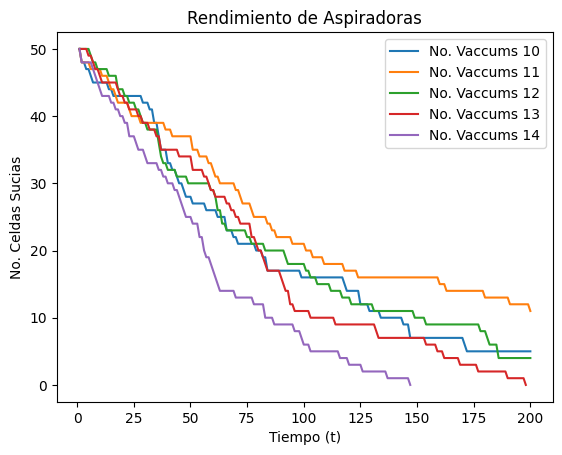

In [84]:
N = 15
M = 15
MIN_AGENTS = 10
MAX_AGENTS = 15
MIN_DIRT = 20
MAX_DIRT = 50
STEPS = 200
ITERATIONS = 1

parameters = {
    'n': N,
    'm': M,
    'n_agents':ap.IntRange(MIN_AGENTS,MAX_AGENTS),
    'n_dirt':MAX_DIRT,
    'steps': STEPS
}
sample = ap.Sample(parameters, n=5)
exp = ap.Experiment(Simulation, sample, iterations=ITERATIONS, record=True)
results = exp.run()
data: pd.DataFrame = results['variables']['Simulation']

for i in range(5):
    arr = data[data.index.get_level_values('sample_id') == i].to_numpy()
    list = np.vstack([a[0] for a in arr]).tolist()
    t = range(1,len(list)+1)
    plt.plot(t, list, label=f"No. Vaccums {10 + i}")

# leg = ax.legend()
plt.legend()
plt.title("Rendimiento de Aspiradoras")
plt.xlabel("Tiempo (t)")
plt.ylabel("No. Celdas Sucias")
plt.show()

## Análisis y Conclusiones
Como se puede observar en los resultados anteriores, es complicado afirmar que a mayor número de aspiradoras, menor tiempo de ejecución se necesitaría para limpiar todo el cuarto. Al realizar el mismo experimento con un número incremental de aspiradoras, como se ven en las __Gráficas 5-8__ es posile ver que no siempre se logra reducir el tiempo de limpieza significativamente y que, independientemente de la cantidad de aspiradoras, y mientras menos celdas limpias haya, mayor tiempo para limpiarlas se necesitara como se observa en las __Gráficas 1-4__. Este resultado podría deberse al tipo de ambiente en donde los agentes se encuentran, siendo parcialmente observable para nuestros agentes aspiradoras. Por todo lo anterior, llegué a la conclusión de que este sistema multiagente no presenta ningun __comportamiento emergente__ a pesar de la coexistencia de múltiples agentes.

No obstante, podría ser posible que, al agregar __heuristicas__ de rendimiento o __memoria__ a las aspiradoras, si se pueda lograr generar algun __comportamiento__ emergente que mejore el rendimiento en el tiempo de ejecución del sistema.